In [ ]:
!pip install datasets
!pip install open_clip_torch
!pip install torch
!pip install transformers
!pip install sentence_transformers
!pip install scipy
!pip install clip_interrogator

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 KB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 KB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 KB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 10.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 20.3 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/si

In [ ]:
import numpy as np
import pandas as pd
from sklearn import metrics
from datasets import load_dataset
from sentence_transformers import SentenceTransformer
import scipy

In [ ]:
# Load the dataset with the `2m_first_1k` subset
dataset = load_dataset('poloclub/diffusiondb', '2m_first_1k')
df = dataset['train'].to_pandas()
df.head()

Generating train split: 0 examples [00:00, ? examples/s]

Dataset diffusiondb downloaded and prepared to /root/.cache/huggingface/datasets/poloclub___diffusiondb/2m_first_1k/0.9.1/547894e3a57aa647ead68c9faf148324098f47f2bc1ab6705d670721de9d89d1. Subsequent calls will reuse this data.


  0%|          | 0/1 [00:00<?, ?it/s]

,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
0,"{'bytes': None, 'path': '/root/.cache/huggingf...","a renaissance portrait of dwayne johnson, art ...",2480545905,50,16.0,k_euler_ancestral,512,768,e9dfc969d22cb9c5621ad075b3826c28f18ef3840c6dda...,2022-08-20 05:28:00+00:00,0.163488,0.000793
1,"{'bytes': None, 'path': '/root/.cache/huggingf...","portrait of a dancing eagle woman, beautiful b...",2250159284,50,9.0,k_lms,512,640,aa60a36693bf9e079b421c1200fd42ed94061fb02078ad...,2022-08-20 05:28:00+00:00,0.276650,0.003090
2,"{'bytes': None, 'path': '/root/.cache/huggingf...","epic 3 d, become legend shiji! gpu mecha contr...",4292948605,50,7.0,k_lms,512,768,3e774662f24c78b0590d57365d755d7dacde8f33dbdc56...,2022-08-20 05:28:00+00:00,0.090421,0.000533
3,"{'bytes': None, 'path': '/root/.cache/huggingf...",an airbrush painting of cyber war machine scen...,2374713726,50,12.0,k_lms,512,768,c2bd0b60caa0aa04d0a7e5972fefc60b21ece352d88353...,2022-08-20 05:29:00+00:00,0.078309,0.000597
4,"{'bytes': None, 'path': '/root/.cache/huggingf...",concept art of a silent hill monster. painted ...,2320897141,50,6.0,k_lms,640,512,08ac4153ab7e13baa55ee74213eb117a29a0024267b29e...,2022-08-20 05:29:00+00:00,0.086802,0.083516


In [ ]:
df['image'] = df['image'].apply(lambda x: x['path'])

df.head()

,image,prompt,seed,step,cfg,sampler,width,height,user_name,timestamp,image_nsfw,prompt_nsfw
0,/root/.cache/huggingface/datasets/downloads/ex...,"a renaissance portrait of dwayne johnson, art ...",2480545905,50,16.0,k_euler_ancestral,512,768,e9dfc969d22cb9c5621ad075b3826c28f18ef3840c6dda...,2022-08-20 05:28:00+00:00,0.163488,0.000793
1,/root/.cache/huggingface/datasets/downloads/ex...,"portrait of a dancing eagle woman, beautiful b...",2250159284,50,9.0,k_lms,512,640,aa60a36693bf9e079b421c1200fd42ed94061fb02078ad...,2022-08-20 05:28:00+00:00,0.276650,0.003090
2,/root/.cache/huggingface/datasets/downloads/ex...,"epic 3 d, become legend shiji! gpu mecha contr...",4292948605,50,7.0,k_lms,512,768,3e774662f24c78b0590d57365d755d7dacde8f33dbdc56...,2022-08-20 05:28:00+00:00,0.090421,0.000533
3,/root/.cache/huggingface/datasets/downloads/ex...,an airbrush painting of cyber war machine scen...,2374713726,50,12.0,k_lms,512,768,c2bd0b60caa0aa04d0a7e5972fefc60b21ece352d88353...,2022-08-20 05:29:00+00:00,0.078309,0.000597
4,/root/.cache/huggingface/datasets/downloads/ex...,concept art of a silent hill monster. painted ...,2320897141,50,6.0,k_lms,640,512,08ac4153ab7e13baa55ee74213eb117a29a0024267b29e...,2022-08-20 05:29:00+00:00,0.086802,0.083516


## Display Test Image

a photograph of a futuristic street scene, brutalist style, straight edges, finely detailed oil painting, impasto brush strokes, soft light, 8 k, dramatic composition, dramatic lighting, sharp focus, octane render, masterpiece, by adrian ghenie and jenny saville and zhang jingna 


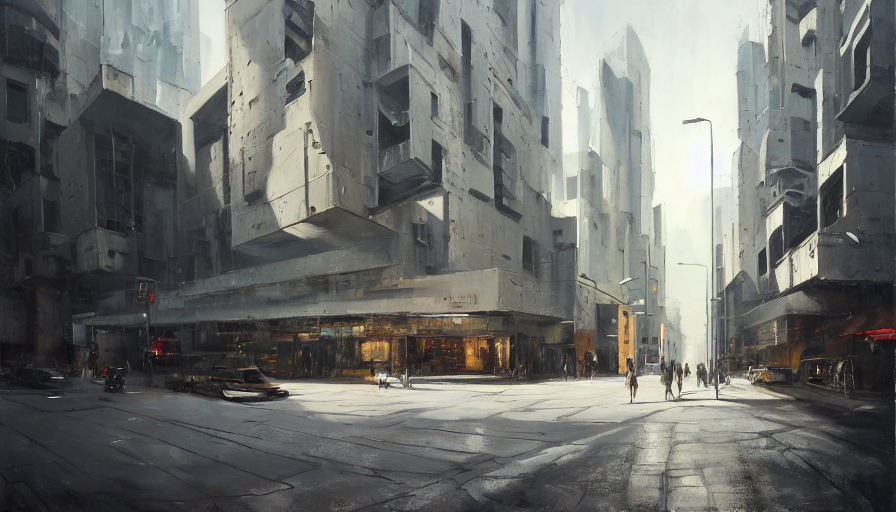

In [ ]:
from PIL import Image

nums = np.random.randint(0, 1000, 1)

for i in nums :
    img = Image.open(df['image'][i])
    prompt = df['prompt'][i]
    print(prompt)
    display(img)

In [ ]:
model_sim = SentenceTransformer('all-MiniLM-L6-v2')

def get_cosine_similarity(sentence1, sentence2, model):
    sentence1_embedding = model.encode(sentence1)
    sentence2_embedding = model.encode(sentence2)
    cosine_score = metrics.pairwise.cosine_similarity([sentence1_embedding], [sentence2_embedding])[0][0]
    return cosine_score

In [ ]:
import open_clip
import torch
from PIL import Image

model, _, transform = open_clip.create_model_and_transforms(
  model_name="coca_ViT-L-14",
  pretrained="mscoco_finetuned_laion2B-s13B-b90k"
)

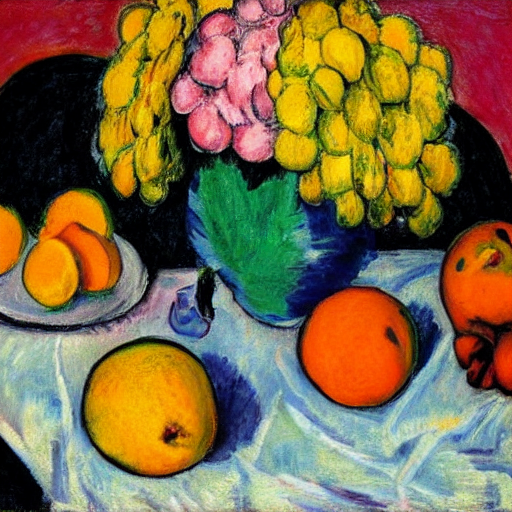


Prompt: gauguinesque, botanical. the flowers are sitting on a pink table cloth next to an orange and two other colorful fruit, by gabriele munter, flickr contest winner, fauvism, fauvism, picasso, painterly 
Open Clip: an oil painting of a bowl of fruit on a table . 
Similarity: 0.44643056

----------------------------------------------------------------------------------------------------

0.44643056


In [ ]:
nums = np.random.randint(0, 1000, 1)

sim = []

for i in nums :
  im = Image.open(df['image'][i]).convert("RGB")
  im = transform(im).unsqueeze(0)

  with torch.no_grad(), torch.cuda.amp.autocast():
    generated = model.generate(im)

  image = Image.open(df['image'][i])
  prompt = df['prompt'][i]
  display(image)
  clip = open_clip.decode(generated[0]).split("<end_of_text>")[0].replace("<start_of_text>", "")
  print()
  print("Prompt:", prompt)
  print("Open Clip:", clip)
  similarity = get_cosine_similarity(prompt, clip, model_sim)
  sim.append(similarity)
  print("Similarity:", similarity)
  print()
  print('-'*100)
  print()

  print(np.mean(sim))

In [ ]:
from transformers import pipeline, set_seed

# Load the GPT-2 model
generator = pipeline('text-generation', model='gpt2')

# Set the random seed for reproducibility
set_seed(42)

In [ ]:
# Define a sentence to generate words for
sentence = "What words would be seen in this context. Answer a list of words. Here's the context:" + clip

# Generate words associated with the sentence
output = generator(sentence, max_length=50, num_return_sequences=1)

# Print the generated output
print(sentence)
print(output[0]['generated_text'])

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1186: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use a generation configuration file (see https://huggingface.co/docs/transformers/main_classes/text_generation)
  warnings.warn(
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


What words would be seen in this context. Answer a list of words. Here's the context:an oil painting of a bowl of fruit on a table . 
What words would be seen in this context. Answer a list of words. Here's the context:an oil painting of a bowl of fruit on a table .  They've given me this in print for lunch. And the poem: a couple


In [ ]:
print(prompt)
print()
print(clip)

gauguinesque, botanical. the flowers are sitting on a pink table cloth next to an orange and two other colorful fruit, by gabriele munter, flickr contest winner, fauvism, fauvism, picasso, painterly 

an oil painting of a bowl of fruit on a table . 


In [ ]:
get_cosine_similarity(prompt, clip, model_sim)

0.44643056

Give me 5 words that would be associated with this context, in a list of 5 words separated by a comma. These words should predict additional qualities. Here's the context: a woman with long red hair and green eyes .



In [ ]:
gpt = 'Traditional Expressive Thoughtful Commanding Mysterious'

get_cosine_similarity(prompt, clip+gpt, model_sim)

0.4660624

## Quadrants

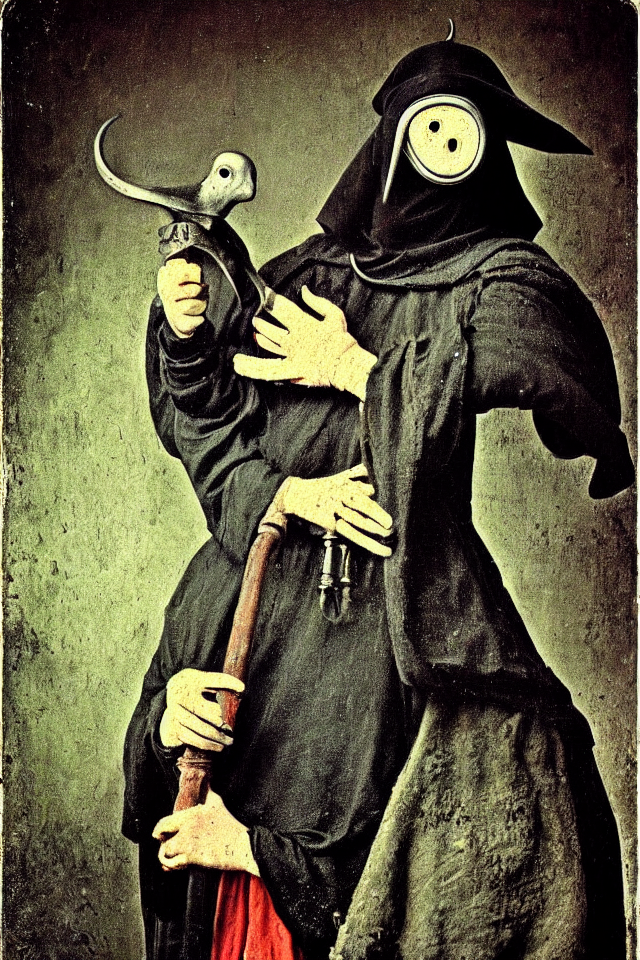

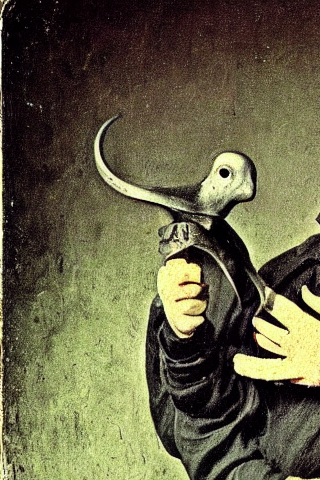

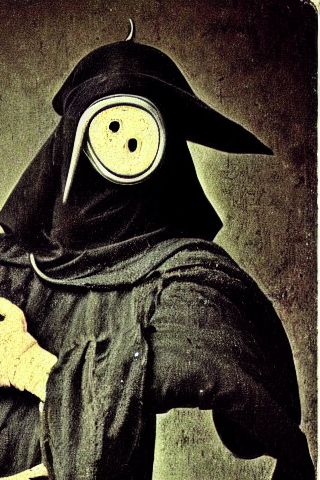

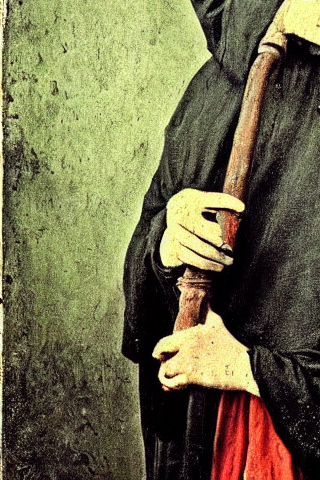

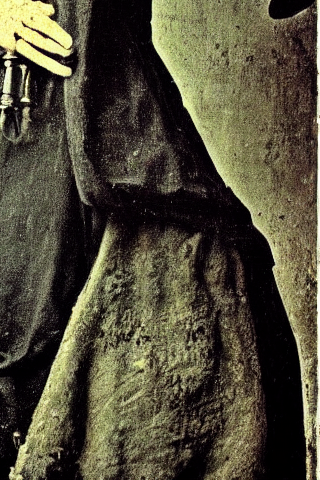

In [ ]:
num_image = 422
image = Image.open(df['image'][num_image])

# split image into 4 quadrants
width, height = image.size
left = 0
top = 0
right = width / 2
bottom = height / 2

# crop image
image1 = image.crop((left, top, right, bottom))
image2 = image.crop((right, top, width, bottom))
image3 = image.crop((left, bottom, right, height))
image4 = image.crop((right, bottom, width, height))

# display images
display(image)
display(image1)
display(image2)
display(image3)
display(image4)

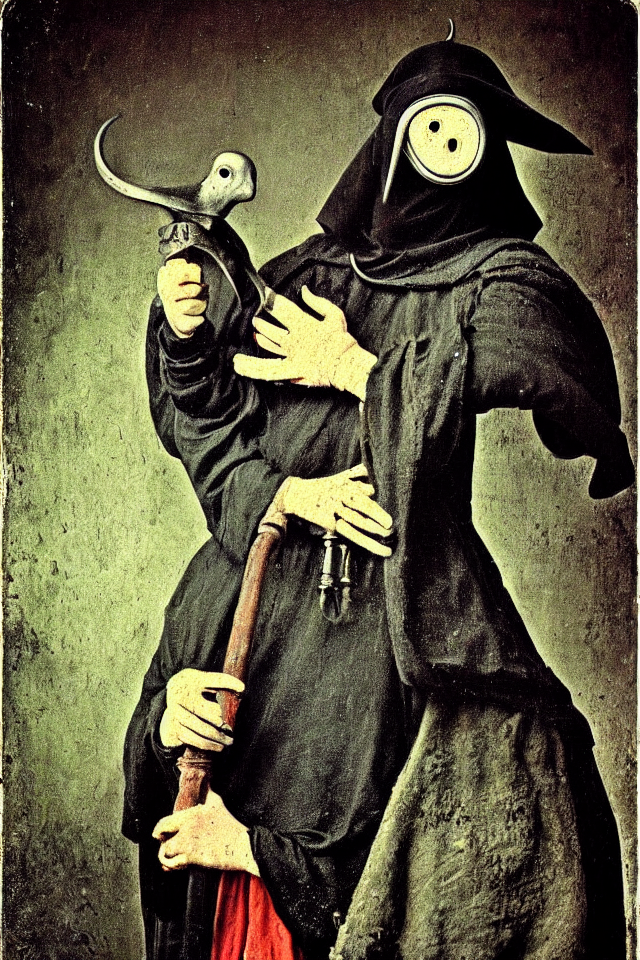

a painting of a person holding a hammer . 



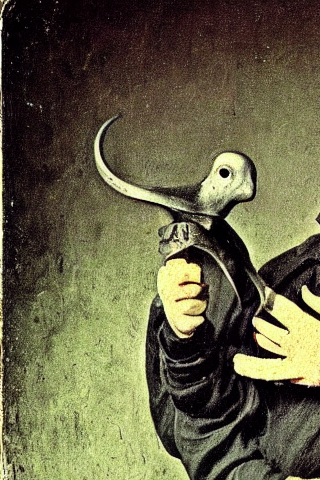

a person holding a metal object in front of a wall . 



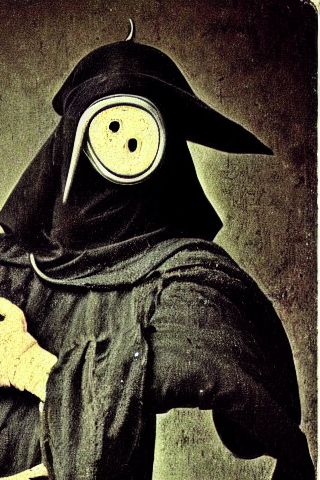

a person wearing a black costume and a black mask . 



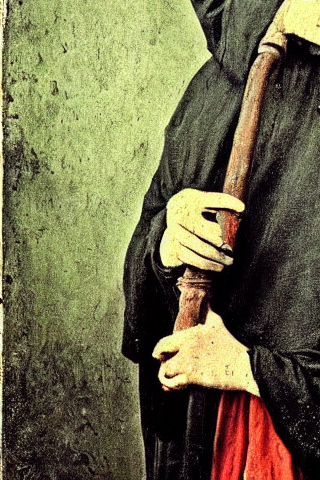

a person holding a wooden stick in their hands . 



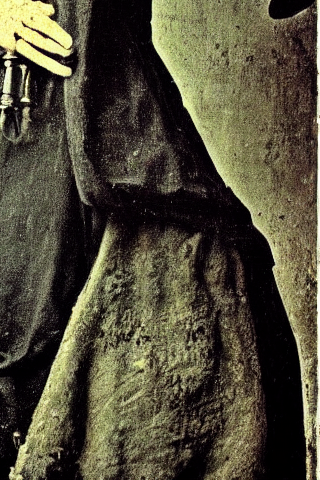

a close - up view of a stone wall . 



In [ ]:
words = []

for img in [image, image1, image2, image3, image4]:
  im = img.convert("RGB")
  im = transform(im).unsqueeze(0)

  with torch.no_grad(), torch.cuda.amp.autocast():
    generated = model.generate(im)

  image = Image.open(df['image'][num_image])
  prompt = df['prompt'][num_image]
  display(img)
  clip = open_clip.decode(generated[0]).split("<end_of_text>")[0].replace("<start_of_text>", "")
  print(clip)
  print()
  words.append(clip)

Write a convolutional network that determines if image would improve if it was split

In [ ]:
def remove_duplicate_words(prompt):
    words = prompt.split()
    return ' '.join(sorted(set(words), key=words.index))

In [ ]:
total_phrase = ''
for word in words :
  total_phrase += word + ' '

total_phrase = remove_duplicate_words(total_phrase)

total_phrase

'a painting of person holding hammer . metal object in front wall wearing black costume and mask wooden stick their hands close - up view stone'

In [ ]:
print(df['prompt'][num_image])

colorful portrait of a plague doctor, ominous, 1 8 0 0 s victorian photo, hand coloured photo, atmospheric, highly detailed, by joel peter witkin and hieronymus bosch 


In [ ]:
get_cosine_similarity(df['prompt'][num_image], words[0], model_sim)

0.32717526

In [ ]:
get_cosine_similarity(df['prompt'][num_image], total_phrase, model_sim)

0.31556457

In [ ]:
gpt = ' Glamour, elegance, beauty, regality, luxury'

get_cosine_similarity(df['prompt'][num_image], total_phrase+gpt, model_sim)

0.45349246

In [ ]:
total_phrase+gpt

'an image of apple computer logo a blue and black background with sky . on dark border Technology, innovation, modernity, creativity, elegance'

In [ ]:
phrase = 'In the painting, a mysterious figure wearing a black costume and mask stands before a wall holding a hammer and metal object, their skilled hands clutching a wooden stick, all in a dramatic close-up view with a background of rough stone.'

In [ ]:
get_cosine_similarity(df['prompt'][num_image], phrase, model_sim)

0.38234577

## Interrogator

In [ ]:
from clip_interrogator import Config, Interrogator
import torch

In [ ]:
config = Config(clip_model_name="ViT-L-14/openai")
ci_vitl = Interrogator(config)
config.blip_model = ci_vitl.blip_model
config.clip_model_name = "ViT-H-14/laion2b_s32b_b79k"
ci_vith = Interrogator(config)

Loading BLIP model...


  0%|          | 0.00/1.66G [00:00<?, ?B/s]

load checkpoint from https://storage.googleapis.com/sfr-vision-language-research/BLIP/models/model_large_caption.pth
Loading CLIP model...


100%|███████████████████████████████████████| 933M/933M [00:15<00:00, 60.4MiB/s]
ViT-L-14_openai_artists.safetensors: 100%|██████████| 16.2M/16.2M [00:00<00:00, 75.5MB/s]
ViT-L-14_openai_flavors.safetensors: 100%|██████████| 155M/155M [00:00<00:00, 193MB/s]
ViT-L-14_openai_mediums.safetensors: 100%|██████████| 146k/146k [00:00<00:00, 8.51MB/s]
ViT-L-14_openai_movements.safetensors: 100%|██████████| 307k/307k [00:00<00:00, 17.0MB/s]
ViT-L-14_openai_trendings.safetensors: 100%|██████████| 111k/111k [00:00<00:00, 7.86MB/s]
ViT-L-14_openai_negative.safetensors: 100%|██████████| 63.2k/63.2k [00:00<00:00, 13.3MB/s]


Loaded CLIP model and data in 28.84 seconds.
Loading CLIP model...


ViT-H-14_laion2b_s32b_b79k_artists.safetensors: 100%|██████████| 21.6M/21.6M [00:00<00:00, 48.2MB/s]
ViT-H-14_laion2b_s32b_b79k_flavors.safetensors: 100%|██████████| 207M/207M [00:01<00:00, 168MB/s]
ViT-H-14_laion2b_s32b_b79k_mediums.safetensors: 100%|██████████| 195k/195k [00:00<00:00, 10.4MB/s]
ViT-H-14_laion2b_s32b_b79k_movements.safetensors: 100%|██████████| 410k/410k [00:00<00:00, 8.62MB/s]
ViT-H-14_laion2b_s32b_b79k_trendings.safetensors: 100%|██████████| 148k/148k [00:00<00:00, 8.66MB/s]
ViT-H-14_laion2b_s32b_b79k_negative.safetensors: 100%|██████████| 84.2k/84.2k [00:00<00:00, 7.48MB/s]

Loaded CLIP model and data in 66.15 seconds.


In [ ]:
def image_to_prompt(image, clip_model_name):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    ci_vith.clip_model = ci_vith.clip_model.to(ci_vith.device)
    ci = ci_vith
    ci.config.blip_num_beams = 2
    ci.config.chunk_size = 512
    ci.config.flavor_intermediate_count = 512

    prompt = ci.interrogate_fast(image)
    return prompt.split(',')[0:3]

In [ ]:
prompt = image_to_prompt(df['image'][2],'ViT-H (best for Stable Diffusion 2.*)')

prompt

TypeError: ignored

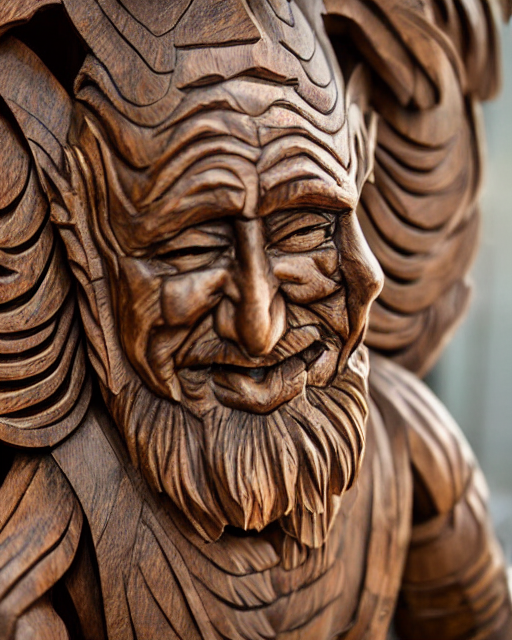

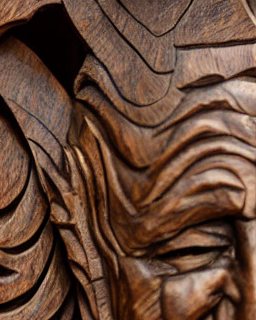

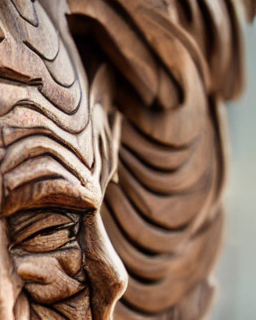

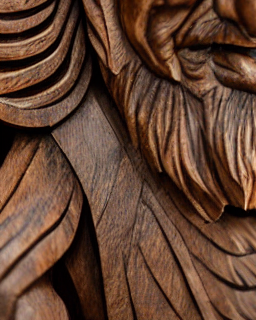

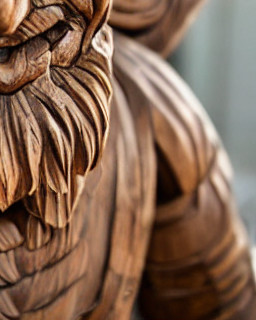

In [ ]:
num_image = 986
image = Image.open(df['image'][num_image])

# split image into 4 quadrants
width, height = image.size
left = 0
top = 0
right = width / 2
bottom = height / 2

# crop image
image1 = image.crop((left, top, right, bottom))
image2 = image.crop((right, top, width, bottom))
image3 = image.crop((left, bottom, right, height))
image4 = image.crop((right, bottom, width, height))

# display images
display(image)
display(image1)
display(image2)
display(image3)
display(image4)

In [ ]:
words = []

for img in [image, image1, image2, image3, image4]:
  clip = image_to_prompt(img,'ViT-H (best for Stable Diffusion 2.*)')
  clip_string = ''
  for i in clip :
    clip_string += i
  print(clip_string)
  print()
  words.append(clip_string)

100%|██████████| 219/219 [00:00<00:00, 607.01it/s]


a wooden carving of a man with a beard wood carving wooden statue



100%|██████████| 219/219 [00:00<00:00, 597.31it/s]


a close up of a carving of a man's face carved wood carved in wood



100%|██████████| 219/219 [00:00<00:00, 633.10it/s]


a wooden sculpture of a man's face detailed wood carving wood carving



100%|██████████| 219/219 [00:00<00:00, 605.74it/s]


a close up of a statue of a man with a beard detailed wood carving carved wood



100%|██████████| 219/219 [00:00<00:00, 623.51it/s]

a wooden statue of a man with a beard wood carving detailed wood carving



In [ ]:
total_phrase = ''
for word in words :
  total_phrase += word + ' '

total_phrase = remove_duplicate_words(total_phrase)

total_phrase

"a wooden carving of man with beard wood statue close up man's face carved in sculpture detailed"

In [ ]:
df['prompt'][num_image]

'a huge wooden carving sculpture of a wizard, intricate details, photograph, sharp focus, depth of field, cinematic lighting, '

In [ ]:
get_cosine_similarity(df['prompt'][num_image], words[0], model_sim)

0.5389894

In [ ]:
get_cosine_similarity(df['prompt'][num_image], total_phrase, model_sim)

0.5422491

In [ ]:
gpt = ' carving, handmade, natural, texture, artistry'

both = remove_duplicate_words(total_phrase + gpt)

get_cosine_similarity(df['prompt'][num_image], both, model_sim)

0.60697854